In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import os

import pickle

import numpy as np
from scipy.stats import sem
from pygam import LinearGAM, s

import pandas as pd

from umap import UMAP
from hdbscan import HDBSCAN as hdbs
from sklearn.cluster import MiniBatchKMeans as mbkm

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

from modules.utils.general_utils.utilities import group_wise_binning
from modules.utils.general_utils.visualizers import visualize_full_panel
from modules.models.unsupervised import auto_kmeans

In [4]:
def sns_styleset():
    sns.set(context='paper', style='ticks', font='DejaVu Sans')
    matplotlib.rcParams['figure.dpi']        = 300
    matplotlib.rcParams['axes.linewidth']    = 1
    matplotlib.rcParams['xtick.major.width'] = 1
    matplotlib.rcParams['ytick.major.width'] = 1
    matplotlib.rcParams['xtick.major.size']  = 3
    matplotlib.rcParams['ytick.major.size']  = 3
    matplotlib.rcParams['xtick.minor.size']  = 2
    matplotlib.rcParams['ytick.minor.size']  = 2
    matplotlib.rcParams['font.size']         = 13
    matplotlib.rcParams['axes.titlesize']    = 13
    matplotlib.rcParams['axes.labelsize']    = 13
    matplotlib.rcParams['legend.fontsize']   = 13
    matplotlib.rcParams['xtick.labelsize']   = 13
    matplotlib.rcParams['ytick.labelsize']   = 13
    
sns_styleset()

In [5]:
INPUTS_PATH = 'data\\train\\inputs\\{}'
TARGETS_PATH = 'data\\train\\targets\\{}'

CMAP = matplotlib.cm.get_cmap('Paired')
CMAP_ENV = matplotlib.cm.get_cmap('tab10')

SNAPSHOTS = 4

TARGETS = [
    'tar_sessions',
    'tar_delta_sessions',    
    'tar_active_time',
    'tar_session_time',
    'tar_activity'
]

with open('results\\saved_objects\\saved_data_containers\\rnn_vs_env_even.pkl', 'rb') as infile:
    DATA_CONTAINER = pickle.load(infile)

In [6]:
TARGETS_RMP = {
    'tar_delta_sessions': 'Future Absence',    
    'tar_active_time': 'Future Active Time',
    'tar_session_time': 'Future Session Time',
    'tar_activity': 'Future Session Activity',
    'tar_sessions': 'Future N° Sessions'
}
INPUTS_RMP = {
    'tar_delta_sessions': 'Absence',    
    'tar_active_time': 'Active Time',
    'tar_session_time': 'Session Time',
    'tar_activity': 'Session Activity',
    'tar_sessions': 'N° Sessions'
}

# REMAPPERS
with open('results\\saved_objects\\mappers\\context.pkl', 'rb') as pickle_file:
    CONTEXT_RMP = pickle.load(pickle_file) 
CONTEXT_RMP = {value: key for key, value in CONTEXT_RMP.items()}

with open('results\\saved_objects\\mappers\\country.pkl', 'rb') as pickle_file:
    COUNT_RMP = pickle.load(pickle_file) 
COUNT_RMP = {value: key for key, value in COUNT_RMP.items()}

with open('results\\saved_objects\\mappers\\hour.pkl', 'rb') as pickle_file:
    HOUR_RMP = pickle.load(pickle_file) 
HOUR_RMP = {value: key for key, value in HOUR_RMP.items()}

with open('results\\saved_objects\\mappers\\day_w.pkl', 'rb') as pickle_file:
    DAYW_RMP = pickle.load(pickle_file) 
DAYW_RMP = {value: key for key, value in DAYW_RMP.items()}

with open('results\\saved_objects\\mappers\\activity_index_type.pkl', 'rb') as pickle_file:
    ACT_RMP = pickle.load(pickle_file) 
ACT_RMP = {value: key for key, value in ACT_RMP.items()}

In [7]:
chosen_game_context = 3
chosen_snapshot = 3 

In [14]:
np.argwhere(DATA_CONTAINER["user_id"][2] ==

array(['00e860eb3ca1f6de5ebf73aa873047b3e5a5bc5a2f734c45b785d74961e3f3fejc4',
       '00e9645dff89793122bcf399efc6658c070e2b99033754e91798ae958439fae3jc4',
       '00e9cd82e02a4aa8efdebcfddcc07870fbca7521178bf2d63302550e29503e89outriders',
       ...,
       'ffffe174385c87342280ae7278f50c05cf8294a175aa7ba3aca365dc068f7c04jc4',
       'fffff179809b85f702e3c532ae67edc7eef5256a2e0bbe137fc5ec10cd0a5b5fhmg',
       'fffffda9ee14b33fc56f395c278e951864aee07675698a263ebb0b4c8eb04515lisbf'],
      dtype='<U73')

In [42]:
dd = pd.DataFrame()
dd["Future Session Time"] = DATA_CONTAINER["prediction"]['RNN_env_even']['tar_session_time'][3].flatten()
dd["Game Context"] = DATA_CONTAINER['context'][3]
dd["Game Context"] = dd["Game Context"].map(CONTEXT_RMP)

dd = dd.groupby("Game Context").median().reset_index()

gg = pd.DataFrame()
gg["Future Session Time"] = DATA_CONTAINER["ground_truth"]['tar_session_time'][2].flatten()
gg["Game Context"] = DATA_CONTAINER['context'][2]
gg["Game Context"] = gg["Game Context"].map(CONTEXT_RMP)

gg = gg.groupby("Game Context").median().reset_index()

ff = pd.merge(
    dd,
    gg,
    on="Game Context"
)
ff["Delta Session Time"] = ff["Future Session Time_x"] - ff["Future Session Time_y"]

Text(0.5, 1.0, 'Difference Between Session 3 and 4')

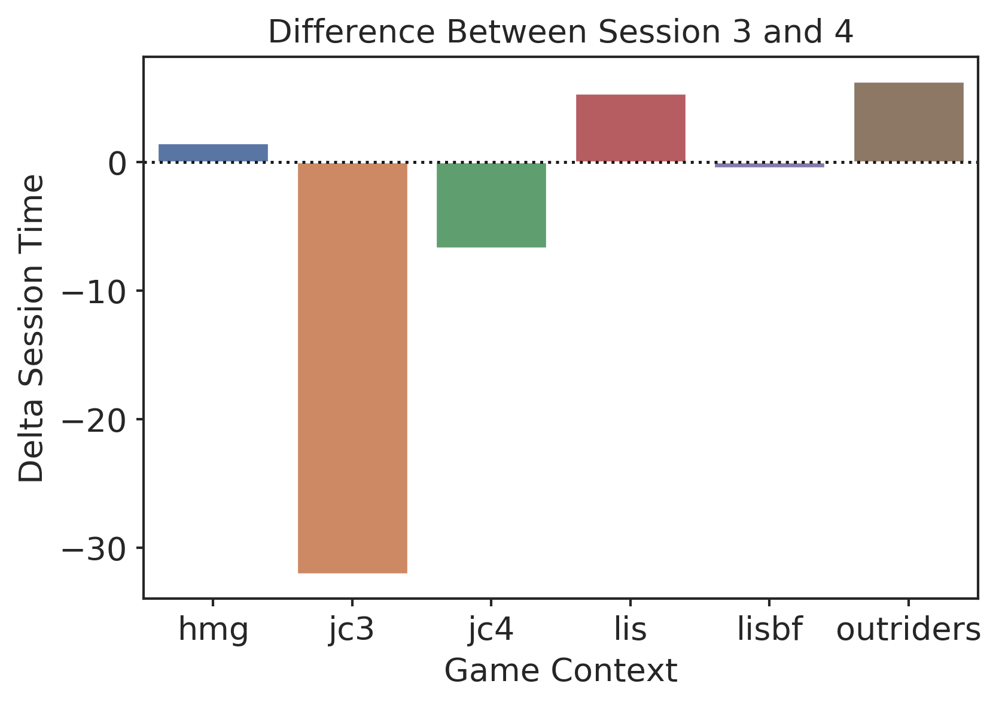

In [43]:
sns.barplot(
    y="Delta Session Time",
    x="Game Context",
    data=ff
)
plt.axhline(linestyle=':', c="k")
plt.title("Difference Between Session 3 and 4")

In [69]:
y

array([[ 77.81408691],
       [ 57.49821091],
       [ 90.75102234],
       ...,
       [103.24566221],
       [ 27.37034587],
       [106.63613464]])

Text(0.5, 1.0, 'Outriders Future Engagement ')

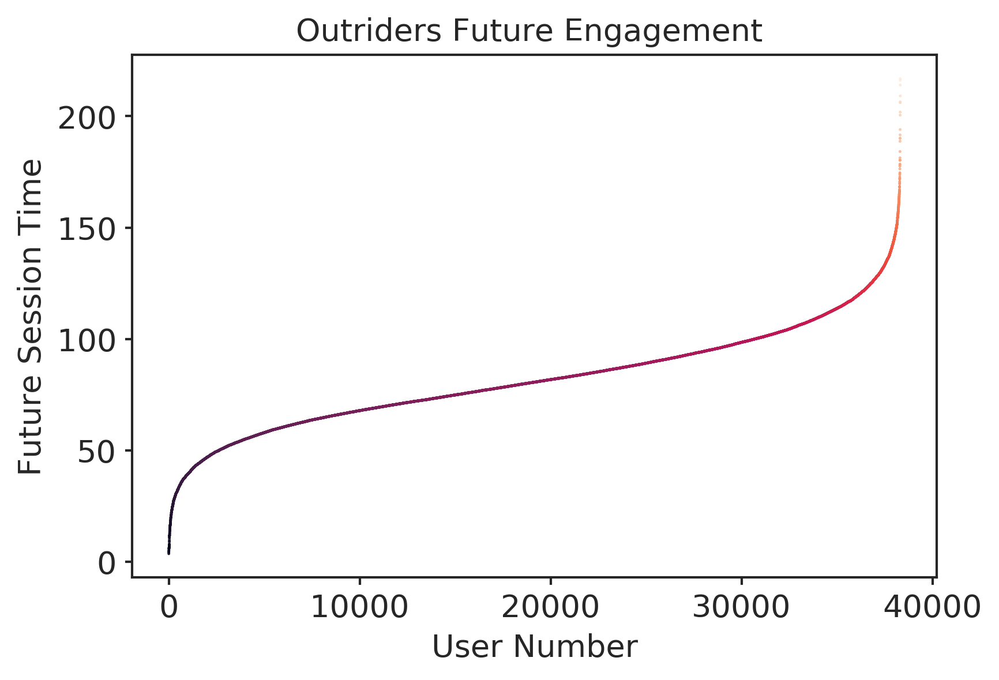

In [74]:
contexts = DATA_CONTAINER['context'][3]
idx = np.argwhere(contexts == 3).flatten()

y = np.sort(DATA_CONTAINER["prediction"]['RNN_env_even']['tar_session_time'][3][idx].flatten())

plt.scatter(
    np.arange(len(y)),
    y,
    s=0.1,
    c=y
)
plt.xlabel("User Number")
plt.ylabel("Future Session Time")
plt.title("Outriders Future Engagement ")

# ------------------------------ BEHAVIOURAL PROFILES -------------------------------------

## BASE MODEL

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:32<00:00, 16.94s/it]


3
Optimal k found at 5
Kneedle found at 5


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


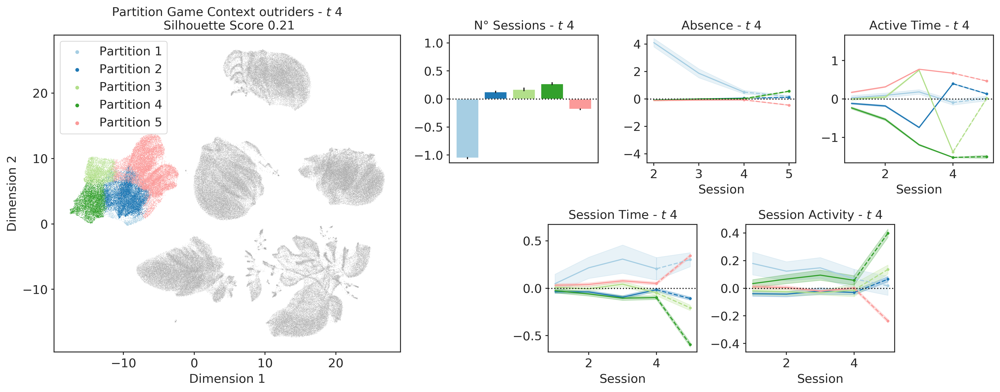

In [12]:
for snapshot in [chosen_snapshot]:
    
    reduction = np.load(
        f'results\\saved_dim_reduction\\RNN_0_lstm_layer_features\\2D\\umap{snapshot}.npy'
    )
    reduction = reduction[~np.isnan(reduction).any(axis=1)]
    
    embed = np.load(
        f'results\\saved_emb\\RNN_0_lstm_layer_features\\{snapshot}.npy'
    )
    embed = embed[~np.isnan(embed).any(axis=1)]

    contexts = DATA_CONTAINER['context'][snapshot]
        
    index = 0
    for context in [chosen_game_context]:
        
        context_idx = np.argwhere(contexts == context).flatten()
        context_name = CONTEXT_RMP[context]
        context_features = embed[context_idx, :]
#         context_features = UMAP(
#             n_components=10, 
#             metric='manhattan', 
#             n_neighbors=30,
#             verbose=True,
#             n_epochs=2000,
#         ).fit_transform(context_features)
        context_features = (context_features - context_features.mean(axis=0)) / context_features.std(axis=0)
        
        #clustering
        clusterer, partition_labels, centroids, silh_score = auto_kmeans(
            X=context_features, 
            min_k=2, 
            max_k=10, 
            verbose=1, 
            fast=True, 
            save_name=f'{context_name}_step_{snapshot+1}',
            max_no_improvement=500,
            batch_size=500,
            max_iter=500,
            n_init=500,
            reassignment_ratio=0.1
        )
        
        # define the gridspec
        fig = plt.figure(figsize=(15, 6))
        spec = fig.add_gridspec(ncols=10, nrows=2)
        
        ax_context = fig.add_subplot(spec[:, :4])
        axs_metrics = [
            fig.add_subplot(spec[0, 4:6]),
            fig.add_subplot(spec[0, 6:8]),
            fig.add_subplot(spec[0, 8:]),
            fig.add_subplot(spec[1, 5:7]),
            fig.add_subplot(spec[1, 7:9])
        ]
        
        # plotting context
        ax_context.scatter(
            np.delete(reduction, context_idx, axis=0)[:, 0],
            np.delete(reduction, context_idx, axis=0)[:, 1],
            s=0.25,
            alpha=0.5,
            marker='o',
            edgecolor='',
            color='darkgray',
        )
        
        for partition_label in np.unique(partition_labels):
            
            partition_idx = np.argwhere(partition_labels == partition_label).flatten()
            context_partition_reduction = reduction[context_idx, :][partition_idx, :]
            ax_context.scatter(
                context_partition_reduction[:, 0],
                context_partition_reduction[:, 1],
                s=0.25,
                marker='o',
                edgecolor='',
                c=CMAP([partition_label] * len(partition_idx)),
                label=f'Partition {partition_label+1}',
            )
        
        index = 0
        for target_name, ax_metric in zip(TARGETS, axs_metrics):
        
            for partition_label in np.unique(partition_labels):

                partition_idx = np.argwhere(partition_labels == partition_label).flatten()
                context_partition_reduction = reduction[context_idx, :][partition_idx, :]

                prediction = DATA_CONTAINER['prediction']['RNN_env_even'][target_name][snapshot]
                context_prediction = prediction[context_idx, :]

                if target_name != 'tar_sessions':
                    metric_name = target_name[4:]
                    metric = DATA_CONTAINER['cont_feat'][metric_name][snapshot]

                    context_metric = metric[context_idx, :]

                    context_line = np.hstack(
                        (context_metric, context_prediction)
                    )
                    context_mean = np.mean(context_line, axis=0)
                    context_std = np.std(context_line, axis=0)

                    context_partition_line = context_line[partition_idx, :]
                    context_partition_line = (context_partition_line - context_mean) / context_std

                    if metric_name == 'delta_sessions':
                        context_partition_line = context_partition_line[:, 1:]
                        steps = [step for step in range(2, context_partition_line.shape[1] +2)]
                    else:
                        steps = [step for step in range(1, context_partition_line.shape[1] +1)]
                    context_partition_sem = sem(
                        context_partition_line
                    )
                    context_partition_line = np.mean(
                        context_partition_line, 
                        axis=0
                    )

                    ax_metric.plot(
                        steps[:-1],
                        context_partition_line[:-1],
                        c=CMAP(partition_label)
                    )
                    ax_metric.fill_between(
                        steps[:-1],
                        context_partition_line[:-1] + (1.96 * context_partition_sem[:-1]),
                        context_partition_line[:-1] - (1.96 * context_partition_sem[:-1]),
                        color=CMAP(partition_label),
                        alpha=0.25
                    )
                    ax_metric.plot(
                        [steps[-2], steps[-1]],
                        [context_partition_line[-2],context_partition_line[-1]],
                        c=CMAP(partition_label),
                        linestyle='--',
                        marker='o',
                        markersize=2
                    )
                    ax_metric.fill_between(
                        np.array([steps[-2], steps[-1]]),
                        np.array([context_partition_line[-2],context_partition_line[-1]]) + (1.96 * np.array([context_partition_sem[-2],context_partition_sem[-1]])),
                        np.array([context_partition_line[-2],context_partition_line[-1]]) - (1.96 * np.array([context_partition_sem[-2],context_partition_sem[-1]])),
                        color=CMAP(partition_label),
                        alpha=0.25
                    )
                else:
                    context_line = np.zeros(
                        shape=(context_prediction.shape[0], snapshot + 1)
                    )
                    context_line[:, -1] = context_prediction.flatten()
                    for r_index in range(snapshot -1,-1,-1):

                        context_line[:, r_index] = context_line[:, r_index+1] + 1

                    context_mean = np.mean(context_line[:, -1])
                    context_std = np.std(context_line[:, -1])
                    context_partition_line = context_line[partition_idx, :]
                    context_partition_line = (context_partition_line - context_mean) / context_std
                    steps = [step for step in range(1, context_partition_line.shape[1] +1)]

                    context_partition_sem = sem(
                        context_partition_line
                    )
                    context_partition_line = np.mean(
                        context_partition_line, 
                        axis=0
                    )

                    ax_metric.bar(
                        partition_label,
                        context_partition_line[-1],
                        color=CMAP(partition_label),
                        yerr=1.96*context_partition_sem[-1]
                    )

            yabs_max = abs(max(ax_metric.get_ylim(), key=abs))
            ax_metric.set_ylim(ymin=-yabs_max, ymax=yabs_max)
            ax_metric.axhline(
                0,
                c='k',
                linestyle=':'
            )

            metric_name = INPUTS_RMP[target_name]
            ax_metric.set_title(f'{metric_name} - $t$ {snapshot+1}')
            if index == 0:
                ax_metric.set_xticks([])
            else:
                ax_metric.set_xlabel('Session')

            index +=1
        
        ax_context.set_title(
            f'Partition Game Context {context_name} - $t$ {snapshot+1} \n Silhouette Score {str(round(silh_score, 2))}'
        )
        ax_context.set_xlabel('Dimension 1')
        ax_context.set_ylabel('Dimension 2')
        ax_context.legend(markerscale=8)
        plt.tight_layout()
        plt.savefig(
            f'results\\figures\\clusterer\\behavioural\\{CONTEXT_RMP[context]}_{snapshot+1}_rnn.png',
            dpi=100,
            bbox_inches='tight'
        )
        plt.show()

## FULL MODEL

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:33<00:00, 10.43s/it]


2
Optimal k found at 4
Kneedle found at 4


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in true_divide


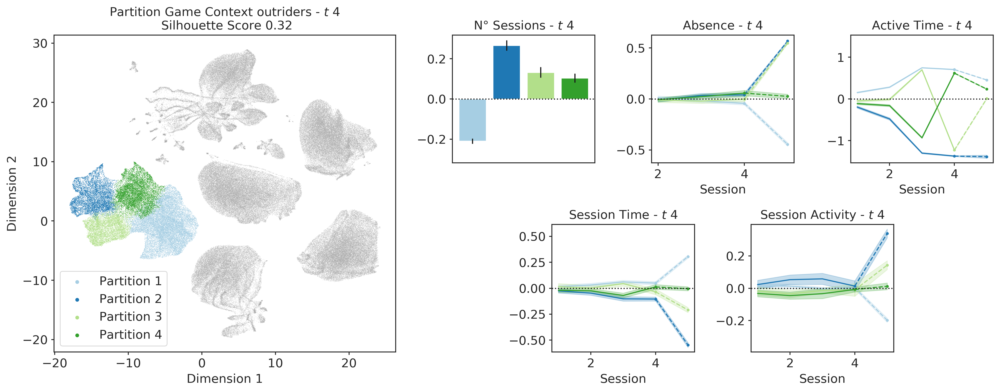

In [13]:
for snapshot in [chosen_snapshot]:
    
    reduction = np.load(
        f'results\\saved_dim_reduction\\RNN_env_even_0_lstm_layer_features\\2D\\umap{snapshot}.npy'
    )
    reduction = reduction[~np.isnan(reduction).any(axis=1)]
    
    embed = np.load(
        f'results\\saved_emb\\RNN_env_even_0_lstm_layer_features\\{snapshot}.npy'
    )
    embed = embed[~np.isnan(embed).any(axis=1)]

    context = DATA_CONTAINER['context'][snapshot]
        
    index = 0
    for context in np.unique([chosen_game_context]):
        
        context_idx = np.argwhere(contexts == context).flatten()
        context_name = CONTEXT_RMP[context]
        context_features = embed[context_idx, :]
#         context_features = UMAP(
#             n_components=10, 
#             metric='manhattan', 
#             n_neighbors=30,
#             verbose=True,
#             n_epochs=2000,
#         ).fit_transform(context_features)
        context_features = (context_features - context_features.mean(axis=0)) / context_features.std(axis=0)
        
        #clustering
        clusterer, partition_labels, centroids, silh_score = auto_kmeans(
            X=context_features, 
            min_k=2, 
            max_k=10, 
            verbose=1, 
            fast=True, 
            save_name=f'{context_name}_step_{snapshot+1}_rnn_beh',
            max_no_improvement=500,
            batch_size=500,
            max_iter=500,
            n_init=500,
            reassignment_ratio=0.1
        )
        
        # define the gridspec
        fig = plt.figure(figsize=(15, 6))
        spec = fig.add_gridspec(ncols=10, nrows=2)
        
        ax_context = fig.add_subplot(spec[:, :4])
        axs_metrics = [
            fig.add_subplot(spec[0, 4:6]),
            fig.add_subplot(spec[0, 6:8]),
            fig.add_subplot(spec[0, 8:]),
            fig.add_subplot(spec[1, 5:7]),
            fig.add_subplot(spec[1, 7:9])
        ]
        
        # plotting context
        ax_context.scatter(
            np.delete(reduction, context_idx, axis=0)[:, 0],
            np.delete(reduction, context_idx, axis=0)[:, 1],
            s=0.25,
            alpha=0.5,
            marker='o',
            edgecolor='',
            color='darkgray',
        )
        
        for partition_label in np.unique(partition_labels):
            
            partition_idx = np.argwhere(partition_labels == partition_label).flatten()
            context_partition_reduction = reduction[context_idx, :][partition_idx, :]
            ax_context.scatter(
                context_partition_reduction[:, 0],
                context_partition_reduction[:, 1],
                s=0.25,
                marker='o',
                edgecolor='',
                c=CMAP([partition_label] * len(partition_idx)),
                label=f'Partition {partition_label+1}',
            )
        
        index = 0
        for target_name, ax_metric in zip(TARGETS, axs_metrics):
        
            for partition_label in np.unique(partition_labels):

                partition_idx = np.argwhere(partition_labels == partition_label).flatten()
                context_partition_reduction = reduction[context_idx, :][partition_idx, :]

                prediction = DATA_CONTAINER['prediction']['RNN_env_even'][target_name][snapshot]
                context_prediction = prediction[context_idx, :]

                if target_name != 'tar_sessions':
                    metric_name = target_name[4:]
                    metric = DATA_CONTAINER['cont_feat'][metric_name][snapshot]

                    context_metric = metric[context_idx, :]

                    context_line = np.hstack(
                        (context_metric, context_prediction)
                    )
                    context_mean = np.mean(context_line, axis=0)
                    context_std = np.std(context_line, axis=0)

                    context_partition_line = context_line[partition_idx, :]
                    context_partition_line = (context_partition_line - context_mean) / context_std

                    if metric_name == 'delta_sessions':
                        context_partition_line = context_partition_line[:, 1:]
                        steps = [step for step in range(2, context_partition_line.shape[1] +2)]
                    else:
                        steps = [step for step in range(1, context_partition_line.shape[1] +1)]
                    context_partition_sem = sem(
                        context_partition_line
                    )
                    context_partition_line = np.mean(
                        context_partition_line, 
                        axis=0
                    )

                    ax_metric.plot(
                        steps[:-1],
                        context_partition_line[:-1],
                        c=CMAP(partition_label)
                    )
                    ax_metric.fill_between(
                        steps[:-1],
                        context_partition_line[:-1] + (1.96 * context_partition_sem[:-1]),
                        context_partition_line[:-1] - (1.96 * context_partition_sem[:-1]),
                        color=CMAP(partition_label),
                        alpha=0.25
                    )
                    ax_metric.plot(
                        [steps[-2], steps[-1]],
                        [context_partition_line[-2],context_partition_line[-1]],
                        c=CMAP(partition_label),
                        linestyle='--',
                        marker='o',
                        markersize=2
                    )
                    ax_metric.fill_between(
                        np.array([steps[-2], steps[-1]]),
                        np.array([context_partition_line[-2],context_partition_line[-1]]) + (1.96 * np.array([context_partition_sem[-2],context_partition_sem[-1]])),
                        np.array([context_partition_line[-2],context_partition_line[-1]]) - (1.96 * np.array([context_partition_sem[-2],context_partition_sem[-1]])),
                        color=CMAP(partition_label),
                        alpha=0.25
                    )
                else:
                    context_line = np.zeros(
                        shape=(context_prediction.shape[0], snapshot + 1)
                    )
                    context_line[:, -1] = context_prediction.flatten()
                    for r_index in range(snapshot -1,-1,-1):

                        context_line[:, r_index] = context_line[:, r_index+1] + 1

                    context_mean = np.mean(context_line[:, -1])
                    context_std = np.std(context_line[:, -1])
                    context_partition_line = context_line[partition_idx, :]
                    context_partition_line = (context_partition_line - context_mean) / context_std
                    steps = [step for step in range(1, context_partition_line.shape[1] +1)]

                    context_partition_sem = sem(
                        context_partition_line
                    )
                    context_partition_line = np.mean(
                        context_partition_line, 
                        axis=0
                    )

                    ax_metric.bar(
                        partition_label,
                        context_partition_line[-1],
                        color=CMAP(partition_label),
                        yerr=1.96*context_partition_sem[-1]
                    )

            yabs_max = abs(max(ax_metric.get_ylim(), key=abs))
            ax_metric.set_ylim(ymin=-yabs_max, ymax=yabs_max)
            ax_metric.axhline(
                0,
                c='k',
                linestyle=':'
            )

            metric_name = INPUTS_RMP[target_name]
            ax_metric.set_title(f'{metric_name} - $t$ {snapshot+1}')
            if index == 0:
                ax_metric.set_xticks([])
            else:
                ax_metric.set_xlabel('Session')

            index +=1
        
        ax_context.set_title(
            f'Partition Game Context {context_name} - $t$ {snapshot+1} \n Silhouette Score {str(round(silh_score, 2))}'
        )
        ax_context.set_xlabel('Dimension 1')
        ax_context.set_ylabel('Dimension 2')
        ax_context.legend(markerscale=8)
        plt.tight_layout()
        plt.savefig(
            f'results\\figures\\clusterer\\behavioural\\{CONTEXT_RMP[context]}_{snapshot+1}_full.png',
            dpi=100,
            bbox_inches='tight'
        )
        plt.show()

# ------------------ ENVIRONMENTAL FACTORS PROFILES -----------------------------

In [30]:
reduction = np.load(f'results\\saved_dim_reduction\\RNN_env_even_0_lstm_layer_env\\2D\\umap3.npy')
reduction = reduction[~np.isnan(reduction).any(axis=1)]

embed = np.load(f'results\\saved_emb\\RNN_env_even_0_lstm_layer_env\\3.npy')
embed = embed[~np.isnan(embed).any(axis=1)]

context_idx = np.argwhere(
    DATA_CONTAINER['context'][3] == chosen_game_context
).flatten()
countries_idx = DATA_CONTAINER['embeddings']['country'][chosen_snapshot][context_idx, 0]
countries_idx = np.argwhere(
    # (countries_idx == 5) | # GB
    (countries_idx == 8) | # IT
    (countries_idx == 18) | # DE
    (countries_idx == 21) | # FR
    (countries_idx == 27) | # ES
    (countries_idx == 40) | # BE
    (countries_idx == 35) | # NL
    (countries_idx == 55) # DK
).flatten()

reduction = reduction[context_idx, :][countries_idx, :]
embed = embed[context_idx, :][countries_idx, :]
embed = UMAP(
    n_components=10, 
    metric='cosine', 
    n_neighbors=30,
    verbose=True,
    n_epochs=2000,
).fit_transform(embed)
embed = (embed - embed.mean(axis=0)) / embed.std(axis=0)

clusterer, partition_labels, centroids, silh_score = auto_kmeans(
    X=embed, 
    min_k=2, 
    max_k=15, 
    verbose=1, 
    fast=True, 
    save_name=f'{context_name}_step_{snapshot+1}',
    max_no_improvement=500,
    batch_size=500,
    max_iter=500,
    n_init=500,
    reassignment_ratio=0.1
)

UMAP(angular_rp_forest=True, metric='cosine', n_components=10, n_epochs=2000, n_neighbors=30, verbose=True)
Fri Nov 19 11:36:26 2021 Construct fuzzy simplicial set
Fri Nov 19 11:36:26 2021 Finding Nearest Neighbors
Fri Nov 19 11:36:26 2021 Building RP forest with 9 trees
Fri Nov 19 11:36:26 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations
Fri Nov 19 11:36:27 2021 Finished Nearest Neighbor Search
Fri Nov 19 11:36:27 2021 Construct embedding


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]


Fri Nov 19 11:37:12 2021 Finished embedding


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [02:18<00:00,  9.88s/it]


3
Optimal k found at 5
Kneedle found at 5


In [58]:
DATA_CONTAINER['prediction']['RNN_env_even'].keys()

dict_keys(['tar_delta_sessions', 'tar_active_time', 'tar_session_time', 'tar_activity', 'tar_sessions'])

In [61]:
global_df = []

for profile in np.unique(partition_labels):

    profile_df = []
    idx_prof = np.argwhere(partition_labels == profile).flatten()

    for session in range(chosen_snapshot + 1):
        
        sess_df = pd.DataFrame(columns=['Profile', 'Session', 'day_w', 'hour'])
        
        day_w = DATA_CONTAINER['embeddings']['day_w'][chosen_snapshot][context_idx, :][countries_idx][idx_prof, :][:, session].flatten()
        hour = DATA_CONTAINER['embeddings']['hour'][chosen_snapshot][context_idx, :][countries_idx][idx_prof, :][:, session].flatten()
        country = DATA_CONTAINER['embeddings']['country'][chosen_snapshot][context_idx, :][countries_idx][idx_prof, :][:, session].flatten()
        session_time = DATA_CONTAINER['prediction']['RNN_env_even']['tar_session_time'][session][context_idx, :][countries_idx][idx_prof, :].flatten()
        absence = DATA_CONTAINER['prediction']['RNN_env_even']['tar_delta_sessions'][session][context_idx, :][countries_idx][idx_prof, :].flatten()
        future_sessions = DATA_CONTAINER['prediction']['RNN_env_even']['tar_sessions'][session][context_idx, :][countries_idx][idx_prof, :].flatten()
        activity = DATA_CONTAINER['prediction']['RNN_env_even']['tar_activity'][session][context_idx, :][countries_idx][idx_prof, :].flatten()
        
        sess_df['day_w'] = day_w
        sess_df['hour'] = hour
        sess_df['country'] = country
        sess_df['Profile'] = profile
        sess_df['Session'] = session
        sess_df['Session Time'] = session_time
        sess_df['Absence'] = absence
        sess_df['N° Sessions'] = future_sessions
        sess_df['Activity'] = activity
        
        profile_df.append(sess_df)
    
    global_df.append(pd.concat(profile_df, ignore_index=True))

global_df = pd.concat(global_df, ignore_index=True)

data_hour = (
    global_df
    .groupby('Profile')['hour']
    .value_counts(normalize=True)
    .mul(100)
    .rename('perc_sessions')
    .reset_index()
)
median_mapper = (
    data_hour
    .groupby('hour')['perc_sessions']
    .median()
    .reset_index()
    .rename({'perc_sessions': 'med_perc_sessions'}, axis=1)
)
data_hour = data_hour.set_index(["Profile","hour"]).unstack(fill_value=0).stack().reset_index()
data_hour = pd.merge(
    data_hour,
    median_mapper,
    how='left',
    on='hour'
)
data_hour['cent_perc_sessions'] = data_hour['perc_sessions'] - data_hour['med_perc_sessions']
data_hour['hour'] = data_hour['hour'].map(HOUR_RMP)

In [62]:
data_week = (
    global_df
    .groupby('Profile')['day_w']
    .value_counts(normalize=True)
    .mul(100)
    .rename('perc_sessions')
    .reset_index()
)
median_mapper = (
    data_week
    .groupby('day_w')['perc_sessions']
    .median()
    .reset_index()
    .rename({'perc_sessions': 'med_perc_sessions'}, axis=1)
)
data_week = data_week.set_index(["Profile","day_w"]).unstack(fill_value=0).stack().reset_index()
data_week = pd.merge(
    data_week,
    median_mapper,
    how='left',
    on='day_w'
)
data_week['cent_perc_sessions'] = data_week['perc_sessions'] - data_week['med_perc_sessions']
data_week['day_w'] = data_week['day_w'].map(DAYW_RMP)

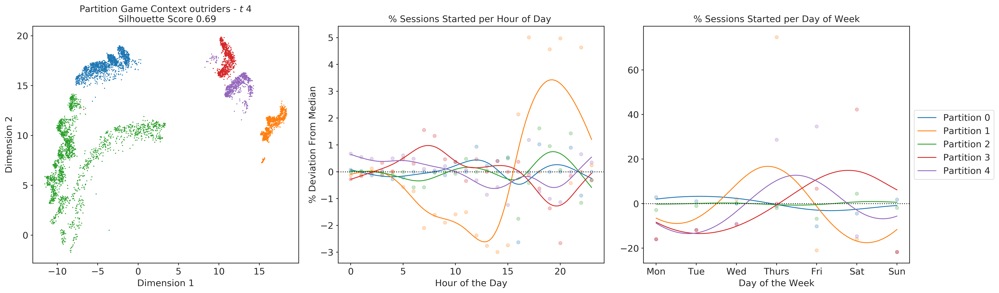

In [63]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

axs[0].scatter(
    reduction[:, 0],
    reduction[:, 1],
    s=0.5,
    c=[CMAP_ENV(label) for label in partition_labels],
)
axs[0].set_ylabel('Dimension 2')
axs[0].set_xlabel('Dimension 1')

for partition in np.unique(partition_labels):
    
    for label, data, ax in zip(['hour', 'day_w'], [data_hour, data_week], axs[1:]):
        
        partition_data = data[
            data['Profile'] == partition
        ].sort_values(label)
        
        
        if label == 'hour':
            n_splines=20
        else:
            n_splines=10
            
        gam = LinearGAM(
            s(0, n_splines=n_splines),
            fit_intercept=False
        )

        gam.fit(
            partition_data[label].values,
            partition_data['cent_perc_sessions'].values
        )

    
        grid = gam.generate_X_grid(
            term=0
        )
        pdep, confi = gam.partial_dependence(
            term=0, 
            X=grid, 
            width=0.95
        )

        ax.plot(
            grid[:, 0],
            pdep,
            color=CMAP_ENV(partition),
            label=f'Partition {partition}'
        )
        ax.scatter(
            partition_data[label].values,
            partition_data['cent_perc_sessions'].values,
            color=CMAP_ENV(partition),
            alpha=0.25
        )


axs[1].set_ylabel('% Deviation From Median')
axs[1].set_xlabel('Hour of the Day')
axs[1].set_title('% Sessions Started per Hour of Day ')
axs[1].axhline(
    0,
    linestyle=':',
    color='k'
)

axs[2].set_ylabel('')
axs[2].set_xlabel('Day of the Week')
axs[2].set_title('% Sessions Started per Day of Week')
axs[2].set_xticks([i for i in range(7)])
axs[2].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun'])
axs[2].axhline(
    0,
    linestyle=':',
    color='k'
)
axs[2].legend(loc='center left', bbox_to_anchor=(1, 0.5))

axs[0].set_title(
    f'Partition Game Context {CONTEXT_RMP[chosen_game_context]} - $t$ {chosen_snapshot+1} \n Silhouette Score {str(round(silh_score, 2))}'
)
plt.tight_layout()
plt.savefig('test.svg')

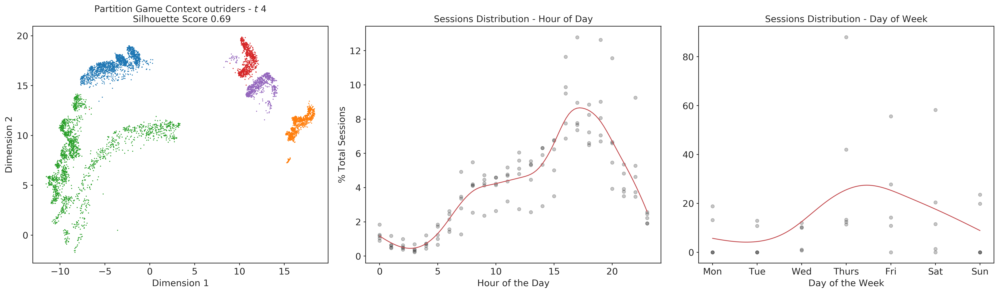

In [64]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

axs[0].scatter(
    reduction[:, 0],
    reduction[:, 1],
    s=0.5,
    c=[CMAP_ENV(label) for label in partition_labels],
)
axs[0].set_ylabel('Dimension 2')
axs[0].set_xlabel('Dimension 1')

    
for label, data, ax in zip(['hour', 'day_w'], [data_hour, data_week], axs[1:]):

    data = data.sort_values(label)

    if label == 'hour':
        n_splines=20
    else:
        n_splines=10

    gam = LinearGAM(
        s(0, n_splines=n_splines),
        fit_intercept=False
    )

    gam.fit(
        data[label].values,
        data['perc_sessions'].values
    )


    grid = gam.generate_X_grid(
        term=0
    )
    pdep, confi = gam.partial_dependence(
        term=0, 
        X=grid, 
        width=0.95
    )

    ax.plot(
        grid[:, 0],
        pdep,
        color='r',
    )
    ax.scatter(
        data[label].values,
        data['perc_sessions'].values,
        color='k',
        alpha=0.25
    )


axs[1].set_ylabel('% Total Sessions')
axs[1].set_xlabel('Hour of the Day')
axs[1].set_title('Sessions Distribution - Hour of Day')

axs[2].set_ylabel('')
axs[2].set_xlabel('Day of the Week')
axs[2].set_title('Sessions Distribution - Day of Week')
axs[2].set_xticks([i for i in range(7)])
axs[2].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun'])

axs[0].set_title(
    f'Partition Game Context {CONTEXT_RMP[chosen_game_context]} - $t$ {chosen_snapshot+1} \n Silhouette Score {str(round(silh_score, 2))}'
)
plt.tight_layout()
#plt.savefig('test.svg')

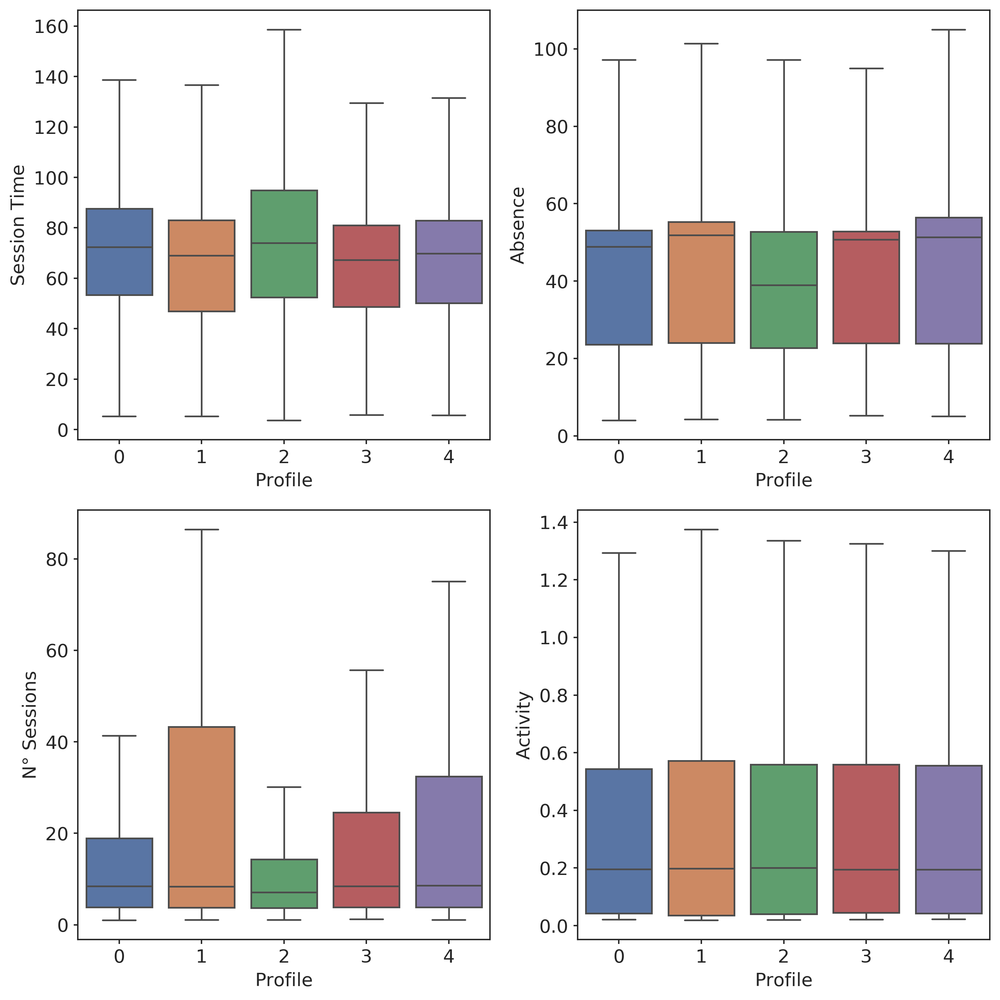

In [77]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for ax, metric in zip(axs.flatten(), ['Session Time', 'Absence', 'N° Sessions', 'Activity']):
    
    sns.boxplot(
        x='Profile',
        y=metric,
        data=global_df,
        showfliers=False,
        ax=ax
    )
    
plt.tight_layout()

# ------------------------------ GAME EVENTS PROFILES -------------------------------------

UMAP(metric='manhattan', n_components=10, n_epochs=2000, n_neighbors=30, verbose=True)
Fri Nov 19 13:52:53 2021 Construct fuzzy simplicial set
Fri Nov 19 13:52:53 2021 Finding Nearest Neighbors
Fri Nov 19 13:52:53 2021 Building RP forest with 15 trees
Fri Nov 19 13:52:54 2021 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	Stopping threshold met -- exiting after 3 iterations
Fri Nov 19 13:52:58 2021 Finished Nearest Neighbor Search
Fri Nov 19 13:52:59 2021 Construct embedding


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]


Fri Nov 19 13:59:26 2021 Finished embedding


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [07:21<00:00, 31.56s/it]


6
Optimal k found at 8
Kneedle found at 8


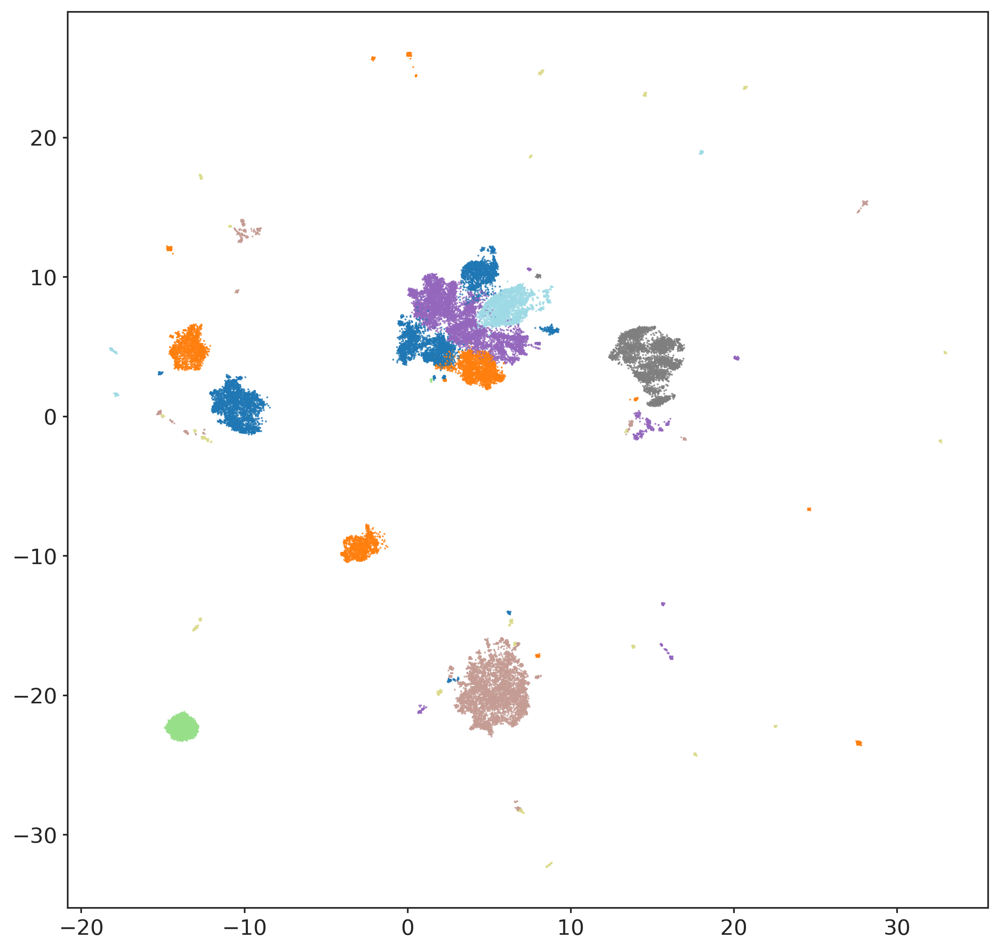

In [85]:
reduction = np.load(f'results\\saved_dim_reduction\\RNN_env_even_0_lstm_layer_events\\2D\\umap3.npy')
reduction = reduction[~np.isnan(reduction).any(axis=1)]

embed = np.load(f'results\\saved_emb\\RNN_env_even_0_lstm_layer_events\\3.npy')
embed = embed[~np.isnan(embed).any(axis=1)]

idx = np.argwhere(DATA_CONTAINER['context'][3] == 3).flatten()

reduction = reduction[idx, :]
embed = embed[idx, :]
embed = UMAP(
    n_components=10, 
    metric='manhattan', 
    n_neighbors=30,
    verbose=True,
    n_epochs=2000,
).fit_transform(embed)
embed = (embed - embed.mean(axis=0)) / embed.std(axis=0)

clusterer, partition_labels, centroids, silh_score = auto_kmeans(
    X=embed, 
    min_k=2, 
    max_k=15, 
    verbose=1, 
    fast=True, 
    save_name=f'{context_name}_step_{snapshot+1}',
    max_no_improvement=1000,
    batch_size=1000,
    max_iter=1000,
    n_init=1000,
    reassignment_ratio=0.1
)

plt.figure(figsize=(10, 10))
plt.scatter(
    reduction[:, 0],
    reduction[:, 1],
    c=partition_labels,
    s=0.1,
    cmap='tab20'
)
plt.show()

In [112]:
global_df = []
global_metrics = []

for profile in np.unique(partition_labels):

    profile_df = []
    metrics_df = []
    idx_prof = np.argwhere(partition_labels == profile).flatten()
    
    for session in range(4):
        
        sess_df = pd.DataFrame(columns=['Profile', 'Session', 'Game Event', 'Frequence'])
        sess_metrics_df = pd.DataFrame()
        
        event = DATA_CONTAINER['act'][3][idx, :, :][idx_prof, :, :][:, session, :].flatten()
        freq = DATA_CONTAINER['freq'][3][idx, :, :][idx_prof, :, :][:, session, :].flatten()
        session_time = DATA_CONTAINER['prediction']['RNN_env_even']['tar_session_time'][session][idx, :][idx_prof, :].flatten()
        absence = DATA_CONTAINER['prediction']['RNN_env_even']['tar_delta_sessions'][session][idx, :][idx_prof, :].flatten()
        future_sessions = DATA_CONTAINER['prediction']['RNN_env_even']['tar_sessions'][session][idx, :][idx_prof, :].flatten()
        activity = DATA_CONTAINER['prediction']['RNN_env_even']['tar_activity'][session][idx, :][idx_prof, :].flatten()

        sess_df['Game Event'] = event
        sess_df['Frequence'] = freq
        sess_df['Session'] = session
        sess_df['Profile'] = profile
        
        sess_metrics_df['Session Time'] = session_time
        sess_metrics_df['Absence'] = absence
        sess_metrics_df['N° Sessions'] = future_sessions
        sess_metrics_df['Activity'] = activity
        sess_metrics_df['Session'] = session
        sess_metrics_df['Profile'] = profile
        
        profile_df.append(sess_df)
        metrics_df.append(sess_metrics_df)
    
    global_df.append(pd.concat(profile_df, ignore_index=True))
    global_metrics.append(pd.concat(metrics_df, ignore_index=True))

global_metrics = pd.concat(global_metrics, ignore_index=True)
global_df = pd.concat(global_df, ignore_index=True)

global_df['Game Event'] = global_df['Game Event'].map(ACT_RMP)
global_df = global_df.dropna()

median_freq_mapper = global_df.groupby(['Session', 'Game Event'])['Frequence'].median().reset_index()
median_freq_mapper = median_freq_mapper.rename({'Frequence': 'median_frequence'}, axis=1)

global_df =  pd.merge(
    global_df,
    median_freq_mapper,
    how='left',
    on=['Session', 'Game Event']
)

global_df['cent_freq'] = global_df['Frequence'] - global_df['median_frequence']
global_df

,Profile,Session,Game Event,Frequence,median_frequence,cent_freq
0,0,0,achievement,0.333333,0.25,0.083333
1,0,0,class_skill,0.333333,0.25,0.083333
2,0,0,skill,0.333333,0.25,0.083333
3,0,0,achievement,0.250000,0.25,0.000000
4,0,0,skill,0.250000,0.25,0.000000
...,...,...,...,...,...,...
344449,7,3,skill,0.500000,0.25,0.250000
344450,7,3,class_skill,0.500000,0.25,0.250000
344451,7,3,skip_cinematic,0.333333,0.25,0.083333
344452,7,3,class_skill,0.333333,0.25,0.083333


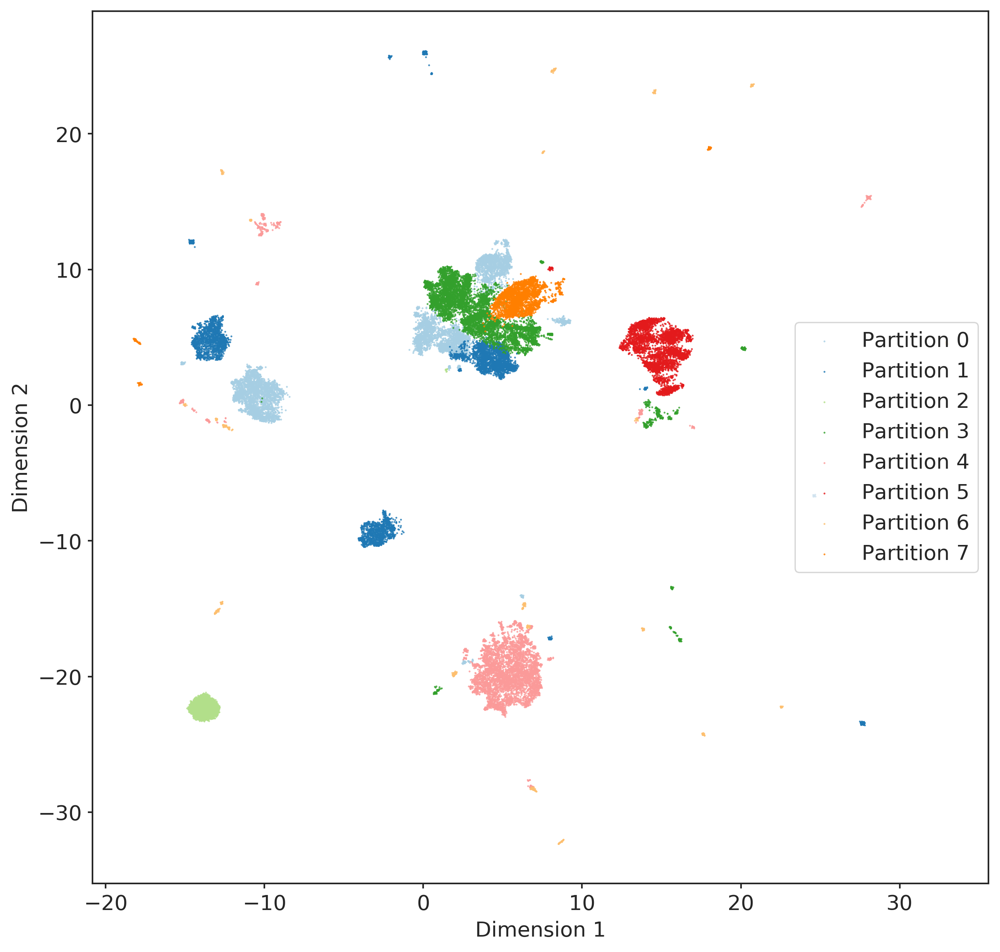

In [142]:
plt.figure(figsize=(10, 10))

for par_lab in np.unique(partition_labels):
    
    p_idx = np.argwhere(partition_labels == par_lab).flatten()
    plt.scatter(
        reduction[p_idx, 0],
        reduction[p_idx, 1],
        color=CMAP(par_lab),
        label=f'Partition {par_lab}',
        s=0.1,
    )

plt.ylabel('Dimension 2')
plt.xlabel('Dimension 1')
plt.legend()
plt.show()

c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\pygam\pygam.py:1111: RuntimeWarning: divide by zero encountered in double_scalars
  r2['explained_deviance'] = 1. - full_d.sum()/null_d.sum()


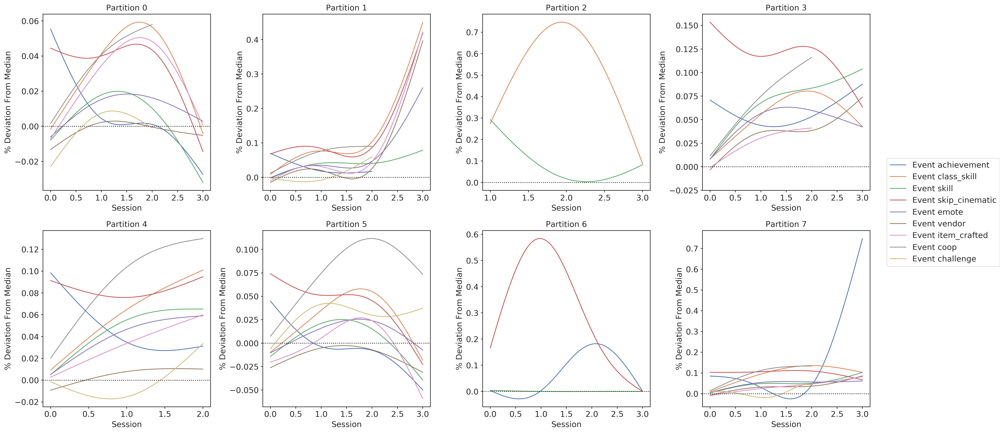

In [144]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# axs[0].scatter(
#     reduction[:, 0],
#     reduction[:, 1],
#     s=0.5,
#     c=[CMAP_ENV(label) for label in partition_labels],
# )
# axs[0].set_ylabel('Dimension 2')
# axs[0].set_xlabel('Dimension 1')

for ax, partition in zip(axs.flatten(), np.unique(partition_labels)):
    
    for event in global_df['Game Event'].unique():
        
        partition_data = global_df[
            (global_df['Profile'] == partition) &
            (global_df['Game Event'] == event)
        ].sort_values('Session')
        
        if len(partition_data) < 5:
            continue
                
        n_splines=10

        gam = LinearGAM(
            s(0, n_splines=n_splines),
            fit_intercept=False
        )

        gam.fit(
            partition_data['Session'].values,
            partition_data['cent_freq'].values
        )

    
        grid = gam.generate_X_grid(
            term=0
        )
        pdep, confi = gam.partial_dependence(
            term=0, 
            X=grid, 
            width=0.95
        )

        ax.plot(
            grid[:, 0],
            pdep,
            #color=CMAP_ENV(event),
            label=f'Event {event}'
        )
#         ax.scatter(
#             partition_data['Session'].values,
#             partition_data['cent_freq'].values,
#             color=CMAP_ENV(partition),
#             alpha=0.25
#         )


        ax.set_ylabel('% Deviation From Median')
        ax.set_xlabel('Session')
        ax.set_title(f'Partition {partition}')
        ax.axhline(
            0,
            linestyle=':',
            color='k'
        )
        
handles, labels = axs.flatten()[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

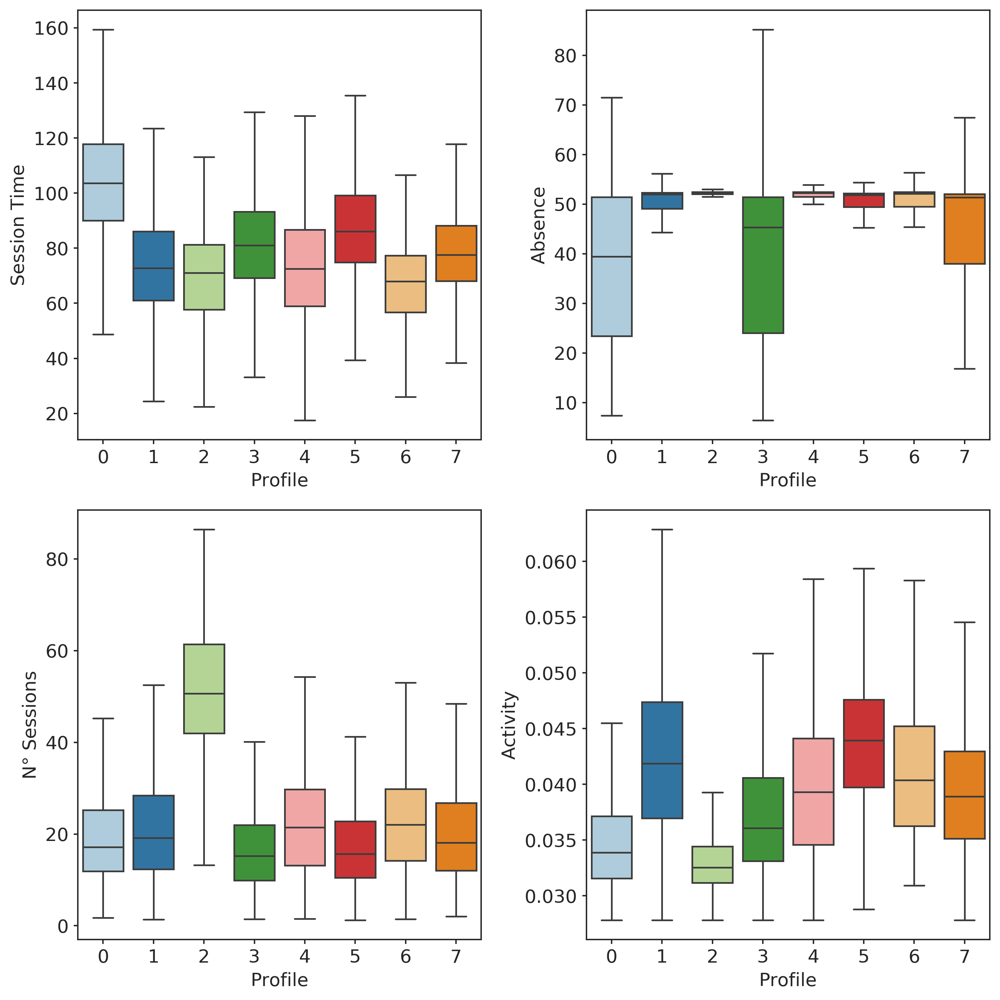

In [133]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for ax, metric in zip(axs.flatten(), ['Session Time', 'Absence', 'N° Sessions', 'Activity']):
    
    sns.boxplot(
        x='Profile',
        y=metric,
        data=global_metrics[global_metrics['Session'] == 3],
        ax=ax,
        showfliers=False,
        palette='Paired'
    )
    
plt.tight_layout()